In [20]:
from __future__ import print_function, division # Make compatible with Python 2

import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

from ipywidgets import interact, interactive, fixed, FloatSlider
import ipywidgets as widgets

import scipy.optimize as optimization

try:
    import mpld3
    mpld3.enable_notebook()
except:
    print("mpld3 not installed, proceeding without zoomable plots")

In [40]:
def gen_data(model='polynomial',model_params=[2,3],noise='gaussian',noise_param=1,start=-10,stop=10,step=1,plot=True):
    x = np.arange(start,stop,step)
    
    # generate a signal
    y = np.zeros_like(x)
    # for polynomial, parameters are coefficients
    if model == 'polynomial':
        for k in range(len(model_params)):
            y += model_params[k]*(x**k)
    # for sinusoid, parameters are amplitude, frequency (0-0.5)
    elif model == 'sinusoid':
        y = model_params[0]*np.sin(x*model_params[1]/(2*np.pi))
    else:
        print('Model must be \'polynomial\' or \'sinusoid\' for now')
        return
    
    # generate noise
    if noise == 'gaussian':
        noise = noise_param*np.random.randn(len(x))
    elif noise == 'laplacian':
        noise = np.random.laplace(0,scale=noise_param,size=len(x))
    elif noise == 'uniform':
        noise = np.random.uniform(low=-0.5*noise_param,high=0.5*noise_param,size=len(x))
    elif noise == 'binomial':
        noise = noise_param*(np.random.binomial(n=1,p=0.5,size=len(x))-0.5)
    else:
        print('Noise must be \'gaussian\', \'laplacian\', \'uniform\', or \'binomial\' for now')
        return
    
    measurement = y + noise
    signal = y
    
    if plot == True:
        plt.plot(x,measurement,'b')
        plt.plot(x,measurement,'bo')
        plt.plot(x,signal,'r')
        for i in range(len(x)):
            plt.plot([x[i],x[i]],[measurement[i],signal[i]],color='grey',ls='--')

    else:
        return (x,measurement,signal)
    
def gen_trials(model='polynomial',model_params=[2,3],noise='gaussian',noise_param=1,start=-10,stop=10,step=1,N=1):
    xs = []
    measurements = []
    for n in range(N):
        (x,measurement,signal) = gen_data(model=model,model_params=model_params,noise=noise,
                                     noise_param=noise_param,start=start,stop=stop,step=step,plot=False)
        xs.extend(x)
        measurements.extend(measurement)
    return (xs,measurements,signal)

In [ ]:
interact(generate_data,model_params = widgets.SelectionSlider(options=[[2],[2,3],[2,3,4]]));

/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


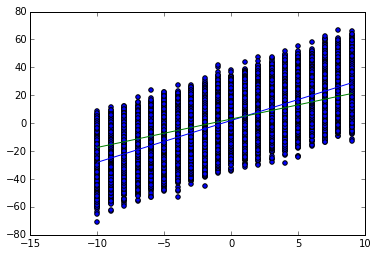

In [71]:
(xs,measurements,signal) = gen_trials(
    model='polynomial',model_params=[2,3],noise='gaussian',noise_param=10,start=-10,stop=10,step=1,N=10000)
x = xs[0:len(signal)]
plt.scatter(xs,measurements)
plt.plot(x,signal);

def poly1(x,a,b):
    return a + b*x

[[a,b],err] = optimization.curve_fit(poly1, xs, measurements, [0,0], 1)

plt.plot(np.asarray(x),a*np.asarray(x)+b);